# Mixed layer heat budget analysis of ACCESS-OM2 runs

This notebook contains a quick analysis of the mixed layer heat budget in ACCESS-OM2, using online heat budget diagnostics.

## Background Theory and diagnostics

### ACCESS-OM2 "Eulerian" heat budget


\begin{align}
  \textit{temp\_tendency} = &\textit{temp\_advection} + \\ &\quad +
  \textit{temp\_submeso} \\ &\quad + \textit{temp\_vdiffuse\_diff\_cbt}  + \textit{temp\_nonlocal\_KPP} \\ &\quad + \textit{sw\_heat} +
  \textit{temp\_rivermix} + \textit{temp\_vdiffuse\_sbc} + \textit{sfc\_hflux\_pme} \\
  & \quad + \textit{frazil\_3d}\\ 
   & \quad + \textit{temp\_vdiffuse\_k33} + \textit{neutral\_diffusion\_temp}\\
   & \quad + \textit{neutral\_gm\_temp} \\
   & \quad + \textit{mixdownslope\_temp} + \textit{temp\_sigma\_diff} + \textit{temp\_eta\_smooth}
\end{align}

All terms are in units of Wm$^{-2}$ - i.e. the tendency of the heat content within each grid cell per unit area, $\rho_0 C_p\Theta \Delta z$, where $\Delta z$ is the time variable grid cell thickness, $\rho_0=1035$kgm$^{-3}$ is the reference density, $C_p=3992.10322329649$Jkg$^{-1}$$^\circ$C$^{-1}$ is the specific heat and $\Theta$ is Conservative Temperature.

- temp\_tendency is the tendency term
- temp\_advection is the convergence of the three-dimensional resolved advection (this can be split into components by taking the convergence of the temp\_xflux\_adv, temp\_yflux\_adv and temp\_zflux\_adv terms)
- temp\_submeso is the convergence of the three-dimensional parameterized submesoscale advection (pretty small).
- temp\_vdiffuse\_diff\_cbt and temp\_nonlocal\_KPP are the vertical mixing terms.
- The next line contains all of the surface heat flux terms. Note that sw\_heat is a three-dimensional term that *redistributes* the impact of SW radiation from the surface layer into the interior (i.e. it is negative in the surface layer and positive below, summing to zero). temp\_rivermix is also three-dimensional as the impact of river runoff is spread over a few layers (4 I think). The other terms are two-dimensional (only non-zero in the surface layer).
- frazil\_3d is the formation of frazil ice
- temp\_vdiffuse\_k33 and neutral\_diffusion\_temp are parameterized along-isopycnal mixing (might not be on in all configurations, e.g. ACCESS-OM2-01).
- neutral\_gm\_temp is parameterization advection by mesoscale eddies
- The last line includes some miscellaneous mixing terms (all pretty small).

Also see https://github.com/COSIMA/access-om2/issues/139#issuecomment-639278547 for a discussion of the surface heat flux terms in ACCESS-OM2/CM2.

### Mixed layer temperature budget 

At each grid cell write the model heat budget above as

$$\frac{\partial (\rho_0 C_p \Theta \Delta z)}{\partial t} = \textit{temp\_tendency} = \sum_i P_i$$

Where $P_i$ are the RHS processes. Units are Wm$^{-2}$. Summing (where we use an integral sign for simplicity) over a mixed layer of depth $MLD(x,y,t)$ gives

$$\int_{-MLD}^\eta \frac{\partial (\rho_0 C_p \Theta \Delta z)}{\partial t} = \int_{-MLD}^\eta \sum_i P_i$$

Using a Leibniz rule for the LHS gives

$$\frac{\partial}{\partial t} \int_{-MLD}^\eta (\rho_0 C_p \Theta \Delta z) - \frac{\partial MLD}{\partial t}\rho_0 C_p \Theta_{ent} = \int_{-MLD}^\eta \sum_i P_i$$

Where $\Theta_{ent}=\Theta(x,y,z=MLD,t)$ is the temperature at the base of the mixed layer. Setting $\int_{-MLD}^\eta (\rho_0 C_p \Theta \Delta z) = \rho_0 C_p \Theta_{MLD} MLD$, where $\Theta_{MLD}$ is the mixed layer average temperature. We thus have:
\begin{align*}
    \frac{\partial (\rho_0 C_p \Theta_{MLD} MLD)}{\partial t} - \frac{\partial MLD}{\partial t}\rho_0 C_p \Theta_{ent} &= \int_{-MLD}^\eta \sum_i P_i \\
    \Longrightarrow \frac{\partial \Theta_{MLD}}{\partial t} + \frac{1}{MLD}\frac{\partial MLD}{\partial t}\left(\Theta_{MLD} - \Theta_{ent}\right) &= \frac{1}{\rho_0 C_p MLD}\int_{-MLD}^\eta \sum_i P_i
\end{align*}

This forms a budget for the tendency of the temperature averaged over the mixed layer (effectively, the SST), where the first term on the LHS is the mixed layer temperature tendency, the second term is the entrainment term and the RHS terms are as before. 

This calculation shows that the entrainment term is not an explicit diagnostic in ACCESS-OM2. However, the above equation suggests a method to compute it. I.e. one could compute a closed budget by computing the mixed layer temperature tendency offline (for full accuracy this should be done with *snapshots* of the temperature rather than time averages) and then computing the entrainment term as a residual from the integral of temp\_tendency over the mixed layer (the LHS of the above equation, divided by MLD). I.e.

$$\frac{1}{MLD}\frac{\partial MLD}{\partial t}\left(\Theta_{MLD} - \Theta_{ent}\right) =  - \frac{\partial \Theta_{MLD}}{\partial t} + \frac{1}{\rho_0 C_p MLD} \int_{-MLD}^\eta temp\_tendency$$


Of course, while it is a closed budget, it's not exactly a budget of the mixed layer temperature because of the averaging time-scale of the diagnostics (e.g. with daily average diagnostics, the terms don't account for subdaily correlations). But it shouldn't be far off. The computations below test this assumption by comparing daily and monthly averaged diagnostics (although the saving of daily averaged diagnostics over a long simulation is rather impractical).

I believe that it is easier to work with the mixed layer temperature budget (as written above), rather than a mixed layer heat content budget, because it is easier to avoid errors associated with mismatches between budget terms and MLD/grid-cell thicknesses. The mixed layer temperature varies much more smoothly with time than the mixed layer heat content (i.e. as the mixed layer depth varies).

In [1]:
#Load required packages
%matplotlib inline
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np
import pandas as pd
import cftime
from datetime import datetime

import cmocean as cm
import sys, os

from dask.distributed import Client
client = Client(processes=False)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 46237 instead
  warnings.warn(


In [2]:
# Load workers:
client = Client(n_workers=16)
client

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 38821 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/38821/status,
Dashboard: /proxy/38821/status,Workers: 16
Total threads: 32,Total memory: 251.18 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:39725,Workers: 16
Dashboard: /proxy/38821/status,Total threads: 32
Started: Just now,Total memory: 251.18 GiB
Comm: tcp://127.0.0.1:44777,Total threads: 2
Dashboard: /proxy/43205/status,Memory: 15.70 GiB
Nanny: tcp://127.0.0.1:38657,


In [3]:
# Chdir for figure saving:
# os.chdir('access-om2-analysis/access-om2-sst-budget')

In [4]:
%%time
# daily data:
ds_budget_daily = xr.open_dataset(base2 + 'ocean_budget_daily.nc').sel(xt_ocean=slice(reg[0],reg[1]),yt_ocean=slice(reg[2],reg[3]))
ds_daily = xr.open_dataset(base2 + 'ocean_daily.nc').sel(xt_ocean=slice(reg[0],reg[1]),yt_ocean=slice(reg[2],reg[3]))

# Add snapshot from previous output:
ds_snapshot_daily = xr.open_dataset(base2 + 'ocean_snapshot_daily.nc').sel(xt_ocean=slice(reg[0],reg[1]),yt_ocean=slice(reg[2],reg[3]))
ds_snapshot_daily_m1 = xr.open_dataset(base2.replace(str(output),str(output-1)) + 'ocean_snapshot_daily.nc').sel(xt_ocean=slice(reg[0],reg[1]),yt_ocean=slice(reg[2],reg[3]))
ds_snapshot_daily = xr.concat([ds_snapshot_daily_m1.isel(time=-1),ds_snapshot_daily],dim='time')

# NOTE: THere is some bug with the time variable in the daily data - it is offset by a few days. 
# Doesn't make a difference for the below calculations (since I'm averaging over all four months).
# However, important to be aware of.

NameError: name 'base2' is not defined

## Define function to compute mixed layer temperature budget

In [5]:
def compute_mixed_layer_temperature_budget(ds_budget,pot_rho_0,dzt):#,ds_snapshot):
    """
    Compute mixed layer temperature budget

    Inputs:
    ds_budget -> dataset containing time-averaged budget quantities
    pot_rho_0 -> dataarray containing time-averaged surface referenced potential density for MLD calculation
    dzt       -> dataarray containing time-averaged grid-cell thicknesses for MLD calculation
    # ds_snapshot -> dataset containing snapshots of temperature, dzt and pot_rho_0 for mixed layer temperature tendency computation

    Outputs:
    budget -> dataset containing all the terms in the diagnosed mixed layer temperature budget
    """
    rho0 = 1035.
    Cp = 3992.10322329649

    bud_vars = ['temp_tendency','temp_advection','temp_submeso','temp_vdiffuse_diff_cbt','temp_nonlocal_KPP',
            'temp_vdiffuse_sbc','frazil_3d','neutral_diffusion_temp','neutral_gm_temp',
            'temp_vdiffuse_k33','neutral_diffusion_temp','neutral_gm_temp','sw_heat','temp_rivermix']
    budget = ds_budget[bud_vars]

    # Sum over mixed layer:
    mld = dzt.where(pot_rho_0 - pot_rho_0.isel(st_ocean=0) < 0.125).sum('st_ocean') # mixed layer depth
    budget = budget.where(pot_rho_0 - pot_rho_0.isel(st_ocean=0) < 0.125).sum('st_ocean') # Budget summed over mixed layer
    budget = budget/rho0/Cp/mld                                                     # Convert units to degC s-1
    
    # ########################################################################################### #    
    # next, the sw_heat flux across the MLD using the same equation as Zhi                        #
    # formula from Paulson and Simpson (1977): ﻿Irradiance measurements in the upper ocean         #
    budget['sw_heat_cross'] = budget['temp_tendency'].copy()                                      #
    #                                                                                             #
    # the vertical redistribution of SWR, at MLD                                                  #
    R=0.58; h1=0.35; h2=23 # constants                                                            #
    #                                                                                             #
    F_PS77=R * np.exp(-mld / h1) + (1-R) * np.exp(-mld / h2) # exponential decay                  #
    budget['sw_heat_cross']     = budget.sw_heat * F_PS77 # shortwave across the mixed-layer base #
    # ########################################################################################### #    
    
    # Add 2D surface layer variables:
    budget['temp_eta_smooth'] = ds_budget['temp_eta_smooth']/rho0/Cp/mld
    budget['sfc_hflux_pme'] = ds_budget['sfc_hflux_pme']/rho0/Cp/mld
    
    # Compute residual for check:
    budget['residual'] = budget['temp_tendency'].copy()
    for var in budget.data_vars:
        budget['residual'] -= budget[var]

    # Compute mixed layer temperature tendency and entrainment term

    # mixed layer temperature from snapshots:
    mld_month = ds_month.dht.where(ds_month.pot_rho_0 - ds_month.pot_rho_0.isel(st_ocean=0) < 0.125).sum('st_ocean') # mixed layer depth
    mlt_month = (ds_month.dht*(ds_month.temp-273.15)).where(ds_month.pot_rho_0 - ds_month.pot_rho_0.isel(st_ocean=0) < 0.125).sum('st_ocean')
    mlt_month = mlt_month/mld_month                    # mixed layer temperature (deg C)
    budget['ml_temp'] = mlt_month
    
    # mixed layer temperature tendency:
    budget['mlt_tendency'] = budget['temp_tendency'].copy()
    budget['mlt_tendency'] = budget['mlt_tendency'].where(budget['mlt_tendency'] == 0)
    budget['entrainment'] = budget['temp_tendency'].copy()
    budget['entrainment'] = budget['entrainment'].where(budget['entrainment'] == 0)
    shape = budget.temp_tendency.shape
    
    # add the four components of the net_sfc_heating flux
    budget['swflx'] = ds_month['swflx']/rho0/Cp/mld # convert from W/m2 to °C/month
    budget['lw_heat'] = ds_month['lw_heat']/rho0/Cp/mld
    budget['sens_heat'] = ds_month['sens_heat']/rho0/Cp/mld
    budget['evap_heat'] = ds_month['evap_heat']/rho0/Cp/mld

    # and also the minor terms
    budget['frazil_3d_int_z']        = ds_month['frazil_3d_int_z']/rho0/Cp/mld
    budget['fprec_melt_heat']        = ds_month['fprec_melt_heat']/rho0/Cp/mld
    # budget['calving_melt_heat']      = ds_month['calving_melt_heat']/rho0/Cp/mld            # no variable named calving_melt_heat
    budget['mh_flux']                = ds_month['mh_flux']/rho0/Cp/mld
    budget['liceht']                 = ds_month['liceht']/rho0/Cp/mld
    budget['sfc_hflux_pme']          = ds_month['frazil_3d_int_z']/rho0/Cp/mld
    budget['sfc_hflux_from_runoff']  = ds_month['sfc_hflux_from_runoff']/rho0/Cp/mld
    # budget['sfc_hflux_from_calving'] = ds_month['sfc_hflux_from_calving']/rho0/Cp/mld       # no variable named sfc_hflux_from_calving
    
    budget['sst'] = ds_month['temp']

    # now also adding the mixed layer depth for bar charts in Fig. 4.
    budget['mld'] = mld_month

    
    # # set all values to zero and then NAN for the mlt_tendency and entrainment variables for now
    # # in the next step, I then add in the data for these two fields
    # budget['mlt_tendency'] = xr.zeros_like(budget['mlt_tendency']).where(budget['mlt_tendency'] != 0)
    # budget['entrainment']  = xr.zeros_like(budget['entrainment']).where(budget['mlt_tendency'] != 0)

    
    # budget['mlt_tendency'].data = mlt_month.isel(time=slice(1,None)).values - mlt_month.isel(time=slice(0,11)).values

    # budget['mlt_tendency'].data = np.transpose(mlt_month.isel(time=slice(0,None)).values - mlt_month.values,(2, 0, 1))
    # budget['mlt_tendency'] = budget['mlt_tendency']/(ds_budget.average_DT / np.timedelta64(1, 's'))

    # Entrainment term by residual:
    # budget['entrainment'] = -(budget['temp_tendency'] - budget['mlt_tendency'])

    return(budget)

## Do computations

In [6]:
%%time
base = ['/g/data/ik11/outputs/access-om2-025/025deg_jra55_iaf_omip2_cycle6/',
        '/g/data/ik11/outputs/access-om2-025/025deg_jra55_iaf_omip2_cycle6_jra55v150_extension/']

# reg = [-100, 20, 0, 60] # Ryan's North Atlantic region
reg = [-100, 20, 0, 70] # Zhi's North Atlantic region


# monthly data:
for e in range(2): # loop through the main run and the extension
    print(' '); print('calculating '+base[e]); print('-------------------------------------------------------------------------------------------------')
    if e == 0: intervall = [305, 365] # output305 to output365 in this directory
    if e == 1: intervall = [366, 373] # the extension has output366 to output372
    
    for f in range(intervall[0],intervall[1]): # loop through each output file
        # if file already exists, skip this iteration of the loop
        if os.path.exists('/g/data/e14/mv7494/NASST_data/mon_budgets_incomplete/mon_budget_temp_om2_omip2_extension_output'+str(f)+'.nc'):
           print('output'+str(f)+' already done')
        else:
            print('creating data for output'+str(f))
            ds_month  = xr.open_dataset(base[e]+'output'+str(f)+'/ocean/ocean_month.nc').sel(xt_ocean=slice(reg[0],reg[1]),yt_ocean=slice(reg[2],reg[3]))
            ds_grid   = xr.open_dataset(base[e]+'output'+str(f)+'/ocean/ocean_grid.nc').sel(xt_ocean=slice(reg[0],reg[1]),yt_ocean=slice(reg[2],reg[3]))
            ds_budget = xr.open_dataset(base[e]+'output'+str(f)+'/ocean/ocean_budget.nc').sel(xt_ocean=slice(reg[0],reg[1]),yt_ocean=slice(reg[2],reg[3]))
        
        # compute monthly budget:
            
            # Add a few terms that are in ds_month in the monthly output:
            ds_budget['sw_heat'] = ds_month['sw_heat']
            ds_budget['sfc_hflux_pme'] = ds_month['sfc_hflux_pme']
            ds_budget['temp_rivermix'] = ds_month['temp_rivermix']

            # --------------------------------------------------------------------------------------------------------------- #
            # here the key part (this uses the function from the cell above)                                                  #
            mon_budget_temp = compute_mixed_layer_temperature_budget(ds_budget,ds_month.pot_rho_0,ds_month.dht)#,ds_snapshot) #
            # --------------------------------------------------------------------------------------------------------------- #
    
            # add time data (average time step in units of nanoseconds - 1e-9)
            mon_budget_temp['average_DT'] = ds_month['average_DT']

            # adding SSTs as well for plotting in Fig. 1.
            mon_budget_temp['sst'] = ds_month['temp'][:,0,:,:]
            # save to file:    
            mon_budget_temp.to_netcdf('/g/data/e14/mv7494/NASST_data/mon_budgets_incomplete/mon_budget_temp_om2_omip2_extension_output'+str(f)+'.nc')
        if f % 5 == 0: print('----------------------------') # print a line every 5 output files
    # Wall time: 2min 18s     for one year
    # Wall time: 2h 36 min 7s for all the output files (output305, ..., output372)

 
calculating /g/data/ik11/outputs/access-om2-025/025deg_jra55_iaf_omip2_cycle6/
-------------------------------------------------------------------------------------------------
output305 already done
----------------------------
output306 already done
output307 already done
output308 already done
output309 already done
output310 already done
----------------------------
output311 already done
output312 already done
output313 already done
output314 already done
output315 already done
----------------------------
output316 already done
output317 already done
output318 already done
output319 already done
output320 already done
----------------------------
output321 already done
output322 already done
output323 already done
output324 already done
output325 already done
----------------------------
output326 already done
output327 already done
output328 already done
output329 already done
output330 already done
----------------------------
output331 already done
output332 already done
out

### Calculating the sw_heat flux across the mixed layer

$$F_{PS77} = R \cdot e^{\frac{-z}{h_1}} + (1-R) \cdot e^{\frac{-z}{h_2}}$$, where $R = 0.58, h_1 = 0.35 and h2 = 23$

In [7]:
# data = xr.open_mfdataset('/g/data/e14/mv7494/NASST_data/mon_budgets_incomplete/' + 'mon_budget_temp_om2_omip2_extension_output371.nc')
# plt.figure(figsize=(16,9))
# for f in range(4):
#     plt.subplot(2,2,f+1)
#     (data.sw_heat[f,:,:]*86400*30.5).plot(levels=np.linspace(-3,3,50), extend='both')
# plt.figure(figsize=(16,9))
# for f in range(4):
#     plt.subplot(2,2,f+1)
#     (data.sw_heat_cross[f,:,:]*86400*30.5).plot(levels=np.linspace(-3,3,50), extend='both')

### Next step, calculating the mixed-layer temperature tendencies and entrainment as a residual
$$\frac{d\Theta}{dt} \Rightarrow \frac{\Delta\Theta}{\Delta t} \Rightarrow \frac{\Theta_2-\Theta1}{t_2-t_1}$$


In [8]:
%%time
full_time_budget = xr.open_mfdataset('/g/data/e14/mv7494/NASST_data/mon_budgets_incomplete/mon_budget_temp_om2_omip2_extension_output*.nc')
# ml_diff = ds.ml_temp.differentiate('time') * 1e9 * 86400 * 30.5 # differentiate in time and convert units from [°C/ns] to [°C/month]
#                                                                 # 1e9 nanoseconds in one second, 86400 seconds in one day, 30.5 days in one month

# with the following analysis, I lose a few data points at the beginning/end of the time period but that is okay because I extended my climatology period to 1980-2011 (32 years) and then
# cut off the two years again to have a clean 30-year climatology
full_time_budget['mlt_tendency'][1:,:,:]   = (full_time_budget.ml_temp.isel(time=slice(1,None)).values - full_time_budget.ml_temp.isel(time=slice(0,-1)).values)   # temp differencing (the top part)
a                 = ((full_time_budget.average_DT.isel(time=slice(1,None)) + full_time_budget.average_DT.isel(time=slice(0,-1))) / 2) / np.timedelta64(1, 's')     # time differencing (the bottom part)
# the second line (a) divides is \Delta t converted to number of seconds by dividing by the timedelta of a second
full_time_budget['mlt_tendency'][1:-1,:,:] = full_time_budget['mlt_tendency'][1:-1,:,:] / a # divide top by bottom part of fraction 

# do the entrainment term by residual:
full_time_budget['entrainment'] = -(full_time_budget['temp_tendency'] - full_time_budget['mlt_tendency'])

# remove the superfluous variables
full_time_budget = full_time_budget.drop_vars(['ml_temp', 'average_DT'])

climatology = full_time_budget.isel(time=slice(276,636)).groupby('time.month').mean('time') # select 1981-01-14 to 2010-12-14
climatology.to_netcdf('/g/data/e14/mv7494/NASST_data/mon_budget_temp_om2_omip2_extension_climatology.nc') # save as netcdf file

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/client.py:3161: UserWarning: Sending large graph of size 561.07 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


CPU times: user 26.1 s, sys: 9.87 s, total: 36 s
Wall time: 49.8 s


In [9]:
a = np.linspace(0,len(full_time_budget.time)+1,len(full_time_budget.time)+1) # array from 0-781, the length of the xarray
for f,g in zip(a[0::12],a[12::12]): # loop through the years, in iterations of 12: [0, 12], [12, 24], [24, 36], ...
    f = int(f); g = int(g)
    year = str(full_time_budget.isel(time=slice(f,g)).time[0].values)[0:4] # select the name of the year from the xr.time information
    # skip iteration if file already exists
    if os.path.exists('/g/data/e14/mv7494/NASST_data/full_mixed_layer_heat_budget_year_'+year+'.nc'):
        print('year '+year+' already done')
    else:
        print('creating file for year '+year)
        # add attributes
        full_time_budget.attrs = {
                           'Project': 'North Atlantic Ocean Heat Wave 2023',
                           'Author': 'Maurice F. Huguenin', 
                           'Data set': 'ACCESS-OM2-025 IAF simulation (cycle6)',
                           'Unit': '°C/month, except for [average_DT] (ns) and [sst] (°C)',
                           'Climatology': '1981-2010 monthly climatology',
                           'Created': datetime.today().strftime('%Y-%m-%d'), 
                           'Mail': 'm.huguenin-virchaux@unsw.edu.au', 
                           'Funding': 'UNSW (Program code 1476), ARC ACEAS (ARC Grant No. SR200100008), ARC CLEX (ARC Grant No. CE170100023)'}
        if f == 0: # remove the first month of data because of the differencing I lose that month's data
            full_time_budget.isel(time=slice(f+1,   g)).to_netcdf('/g/data/e14/mv7494/NASST_data/full_mixed_layer_heat_budget_year_'+year+'.nc') # save as netcdf file
        if f == 780: # same for the very last data entry
            full_time_budget.isel(time=slice(f  , g-2)).to_netcdf('/g/data/e14/mv7494/NASST_data/full_mixed_layer_heat_budget_year_'+year+'.nc') # save as netcdf file
        else:
            full_time_budget.isel(time=slice(f  ,   g)).to_netcdf('/g/data/e14/mv7494/NASST_data/full_mixed_layer_heat_budget_year_'+year+'.nc') # save as netcdf file
    if f % 5 == 0: print('----------------------------') # print a line every 5 output files
# Wall time: 46.4 s

year 1958 already done
----------------------------
year 1959 already done
year 1960 already done
year 1961 already done
year 1962 already done
year 1963 already done
----------------------------
year 1964 already done
year 1965 already done
year 1966 already done
year 1967 already done
year 1968 already done
----------------------------
year 1969 already done
year 1970 already done
year 1971 already done
year 1972 already done
year 1973 already done
----------------------------
year 1974 already done
year 1975 already done
year 1976 already done
year 1977 already done
year 1978 already done
----------------------------
year 1979 already done
year 1980 already done
year 1981 already done
year 1982 already done
year 1983 already done
----------------------------
year 1984 already done
year 1985 already done
year 1986 already done
year 1987 already done
year 1988 already done
----------------------------
year 1989 already done
year 1990 already done
year 1991 already done
year 1992 alrea

### Plot the mixed layer spaghetti plot
- needs the ml_temp variable

In [10]:
# %%time
# timeaxis = np.linspace(1,12,12)
# clim = xr.open_dataset('/g/data/e14/mv7494/NASST_data/' + 'mon_budget_temp_om2_omip2_extension_climatology.nc').ml_temp.mean(['yt_ocean', 'xt_ocean']).load()

# plt.figure(figsize=(20,5))
# for year in range(1958, 2024):
#     data = xr.open_dataset('/g/data/e14/mv7494/NASST_data/' + 'full_mixed_layer_heat_budget_year_'+str(year)+'.nc').ml_temp.mean(['yt_ocean', 'xt_ocean']).load()
#     plt.axhline(0, c='k', lw=.5)
#     if year !=2023: 
#         anom = data.values - clim.values
#         plt.plot(timeaxis, anom, c='grey', lw=.5)
#     if year == 2020: plt.plot(timeaxis, anom, c='grey', lw=.5, label='1958-2020')
#     if year == 2023: anom = np.append(data.values,np.nan) - clim.values
#     if year == 2021: plt.plot(timeaxis, -anom, c='g', lw=1.5, label='2021')
#     if year == 2022: plt.plot(timeaxis, -anom, c='b', lw=1.5, label='2022')
#     if year == 2023: plt.plot(timeaxis, -anom, c='r', lw=1.5, label='2023')
# plt.ylabel('(°C)'); plt.legend(); plt.xlim([1,12]); plt.title('ACCESS-OM2-025 North Atlantic mixed-layer temperature anomalies, 1981-2010 climatology'); plt.xlabel('Month of year')
# plt.savefig('NASST_figures/mixed_layer_temperature_anomalies_1958-2023',dpi=300)

### Plot the climatology for months May, June, July, August

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/client.py:3161: UserWarning: Sending large graph of size 560.65 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/client.py:3161: UserWarning: Sending large graph of size 560.66 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


IndexError: index 20 is out of bounds for axis 0 with size 20

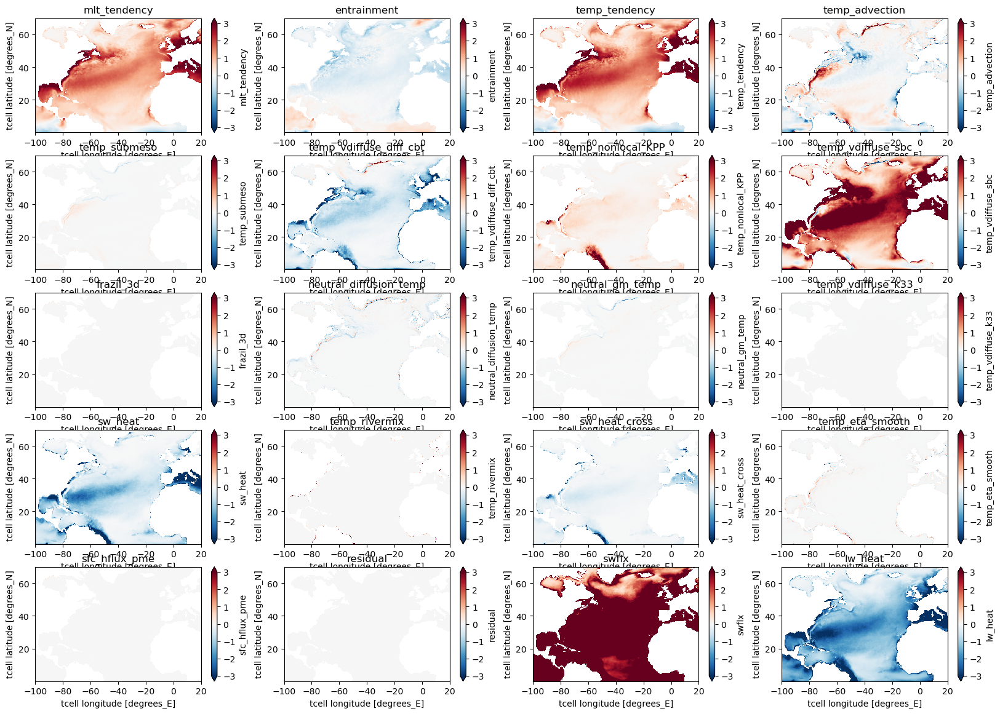

In [11]:
%%time
# Spatial plots of all terms:
monat = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
for f in [4,5,6,7]: # May to August
    fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(20,14)) # create figure
    axs = axes.reshape(-1)
    
    # Select budget and convert units
    budget = climatology.isel(month=f)*86400*30.5 # Average May-July and convert from degC s-1 to degC/month
    # budget = day_budget_temp.mean('time')*86400*30.5 # Average May-July and convert from degC s-1 to degC/month
    
    vars = list(budget.data_vars)
    vars.remove('entrainment');vars.insert(0,'entrainment');vars.remove('mlt_tendency');vars.insert(0,'mlt_tendency');
    
    clim = 3. # limit of colour bar
    for i, var in enumerate(vars):
        budget[var].plot(ax=axs[i],cmap='RdBu_r',vmin=-clim,vmax=clim,extend='both')#,vmax=0.001)#vmin=-0.1,vmax=0.1) 
        axs[i].set_title(var)
    # Note: Make the color limits much smaller and look at "residual" to see that it closes. Although, of course, you can't 
    # check that the mlh_tendency and entrainment calculations close since they are done by residual.
    
    for ax in axs:
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_facecolor('k')
    # plt.tight_layout()
    plt.suptitle('1981-2010 climatology for '+monat[f], fontsize=24, y=.98) # overall title at the top
    print('figure for '+monat[f]+' done')
    plt.savefig('NASST_figures/climatology_mlt_budget_month_'+monat[f],dpi=300) # save figure
# Wall time: 2min 32 s

### Plot anomalies for May, June, July and August 2023

In [14]:
%%time
climatology = xr.open_dataset('/g/data/e14/mv7494/NASST_data/' + 'mon_budget_temp_om2_omip2_extension_climatology.nc')
data = xr.open_dataset('/g/data/e14/mv7494/NASST_data/' + 'full_mixed_layer_heat_budget_year_2023.nc')
data = data.drop_vars(['temp_tendency', 'sst', 'swflx', 'lw_heat', 'sens_heat', 'evap_heat'])
data['vertical_mixing'] = data['temp_vdiffuse_diff_cbt'] + data['temp_nonlocal_KPP']
data['net_sfc_heating'] = data['temp_rivermix'] + data['sw_heat'] + data['temp_vdiffuse_sbc'] + data['sfc_hflux_pme']+ data['frazil_3d'] + data['frazil_3d_int_z'] + data['fprec_melt_heat'] + data['mh_flux'] + data['liceht']+ data['sfc_hflux_from_runoff']
data['along_isopycnal_mixing'] = data['temp_vdiffuse_k33'] + data['neutral_diffusion_temp']
data['residual'] = data['residual'] + data['temp_eta_smooth']
data = data.drop_vars(['temp_vdiffuse_diff_cbt', 'temp_nonlocal_KPP', 'temp_rivermix', 'sw_heat', 'temp_vdiffuse_sbc', 'sfc_hflux_pme', 'frazil_3d',
                      'neutral_diffusion_temp', 'temp_vdiffuse_k33', 'sw_heat_cross', 'frazil_3d_int_z', 'fprec_melt_heat', 'mh_flux', 
                       'liceht', 'sfc_hflux_from_runoff', 'temp_eta_smooth'])

climatology = climatology.drop_vars(['temp_tendency', 'sst', 'swflx', 'lw_heat', 'sens_heat', 'evap_heat'])
climatology['vertical_mixing'] = climatology['temp_vdiffuse_diff_cbt'] + climatology['temp_nonlocal_KPP']
climatology['net_sfc_heating'] = climatology['temp_rivermix'] + climatology['sw_heat'] + climatology['temp_vdiffuse_sbc'] + climatology['sfc_hflux_pme']+ climatology['frazil_3d'] + climatology['frazil_3d_int_z'] + climatology['fprec_melt_heat'] + climatology['mh_flux'] + climatology['liceht']+ climatology['sfc_hflux_from_runoff']
climatology['along_isopycnal_mixing'] = climatology['temp_vdiffuse_k33'] + climatology['neutral_diffusion_temp']
climatology['residual'] = climatology['residual'] + climatology['temp_eta_smooth']
climatology = climatology.drop_vars(['temp_vdiffuse_diff_cbt', 'temp_nonlocal_KPP', 'temp_rivermix', 'sw_heat', 'temp_vdiffuse_sbc', 'sfc_hflux_pme', 'frazil_3d',
                      'neutral_diffusion_temp', 'temp_vdiffuse_k33', 'sw_heat_cross', 'frazil_3d_int_z', 'fprec_melt_heat', 'mh_flux', 
                       'liceht', 'sfc_hflux_from_runoff', 'temp_eta_smooth'])

CPU times: user 211 ms, sys: 117 ms, total: 328 ms
Wall time: 259 ms


figure for May done
figure for June done
figure for July done
figure for August done


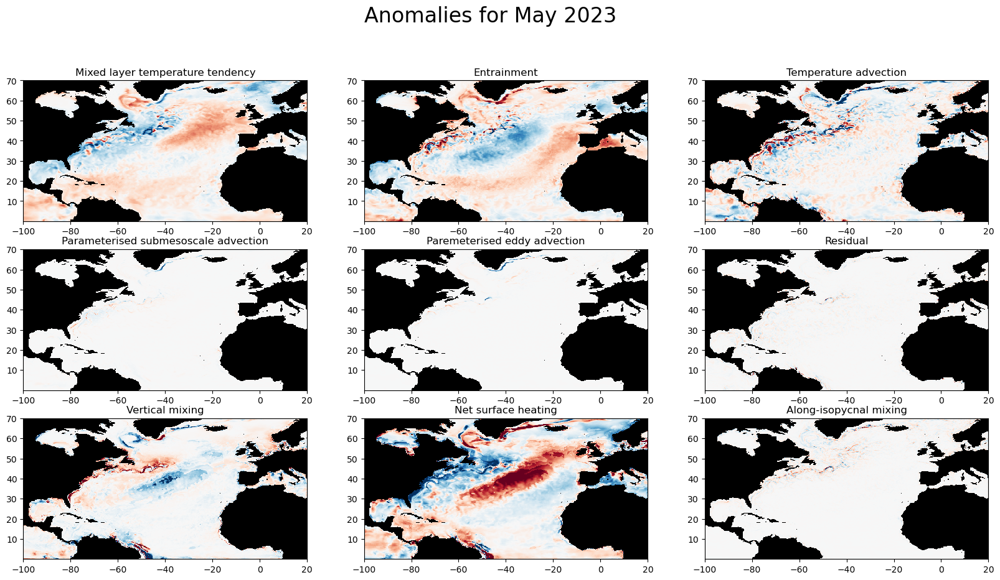

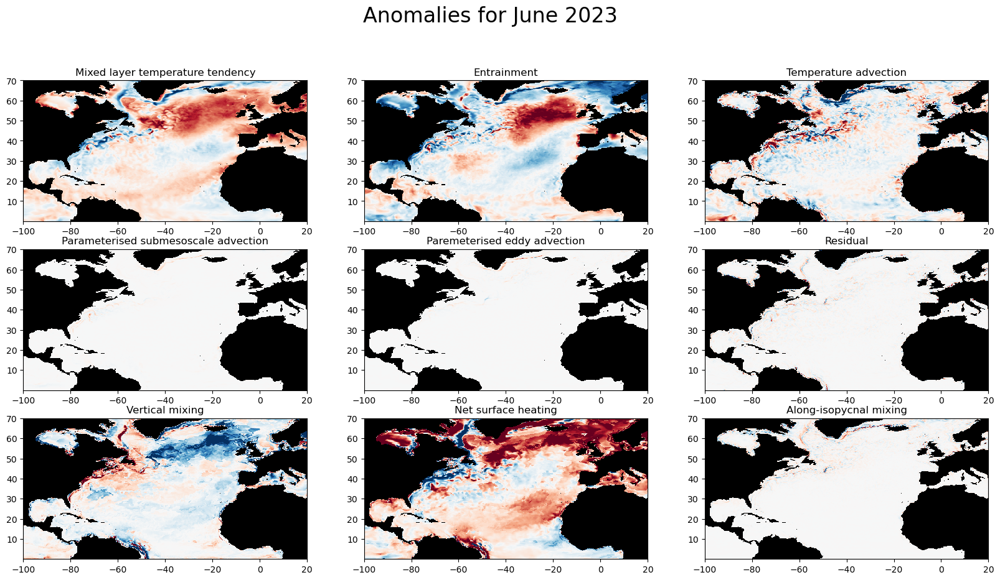

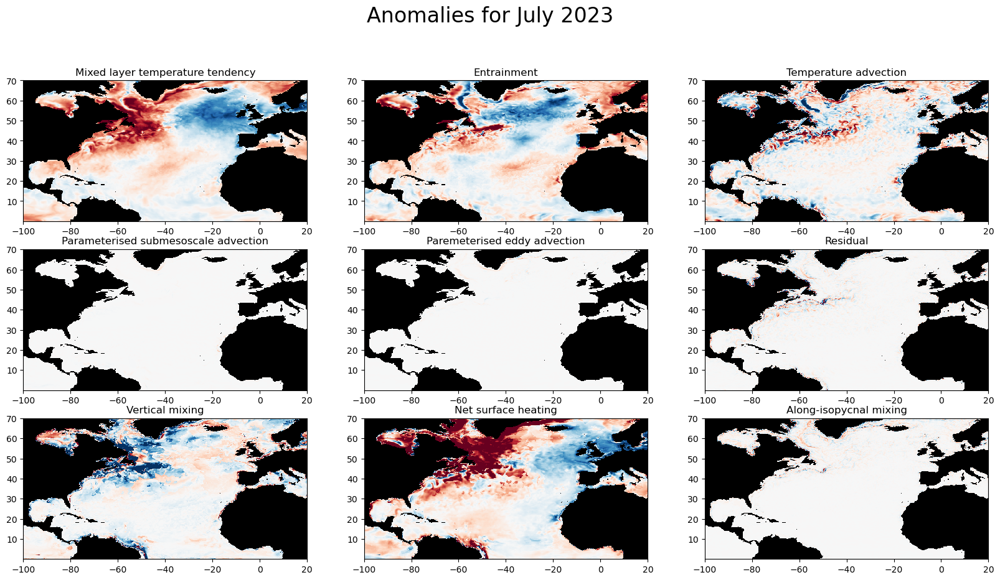

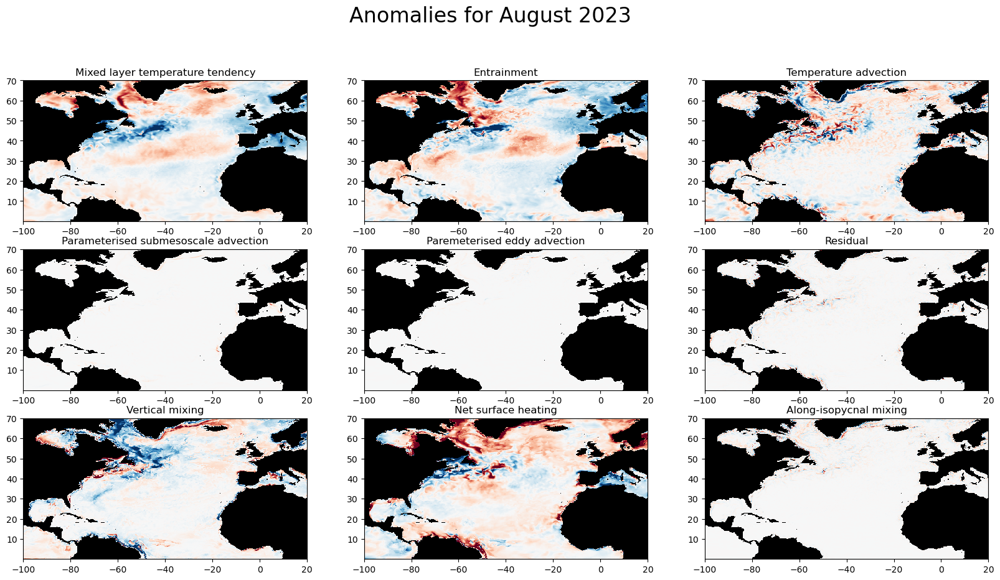

In [15]:
data

# Spatial plots of all terms:
monat = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
names = ['Mixed layer temperature tendency', 
         'Entrainment', 
         'Temperature advection',
         'Parameterised submesoscale advection', 
         'Paremeterised eddy advection',
         'Residual',
         'Vertical mixing',
         'Net surface heating',
         'Along-isopycnal mixing']

for f in [4,5,6,7]:
    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20,10)) # figure with same ratio as an A4 page
    axs = axes.reshape(-1)
    
    # Select budget and convert units
    maps = data.isel(time=f)-climatology.isel(month=f)
    budget = maps*86400*30.5 # Average May-July and convert from degC s-1 to degC/month
    # budget = day_budget_temp.mean('time')*86400*30.5 # Average May-July and convert from degC s-1 to degC/month
    
    vars = list(budget.data_vars)
    vars.remove('entrainment');vars.insert(0,'entrainment');vars.remove('mlt_tendency');vars.insert(0,'mlt_tendency');
    
    clim = 3.
    for i, var in enumerate(vars):
        # print(var)
        budget[var].plot(ax=axs[i],cmap='RdBu_r',vmin=-clim,vmax=clim,extend='both', add_colorbar=False)#,vmax=0.001)#vmin=-0.1,vmax=0.1) 
        axs[i].set_title(names[i])

    # Note: Make the color limits much smaller and look at "residual" to see that it closes. Although, of course, you can't 
    # check that the mlh_tendency and entrainment calculations close since they are done by residual.
    
    for ax in axs:
        ax.set_xlabel(''); ax.set_ylabel('')
        ax.set_facecolor('k')
      # ax.set_xticklabels([])
    # plt.tight_layout()
    plt.suptitle('Anomalies for '+monat[f]+' 2023', fontsize=24, y=1)
    print('figure for '+monat[f]+' done')
    plt.savefig('NASST_figures/anomalies_mlt_budget_month_'+monat[f],dpi=150)
# Wall time: 23.7 s

### Now the main terms

CPU times: user 7.77 s, sys: 675 ms, total: 8.45 s
Wall time: 7.19 s


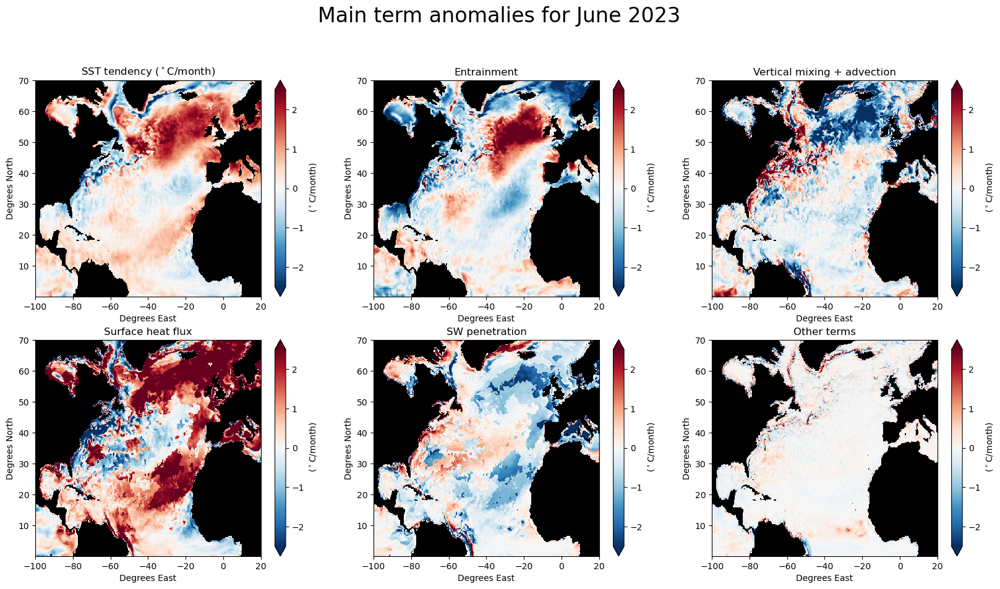

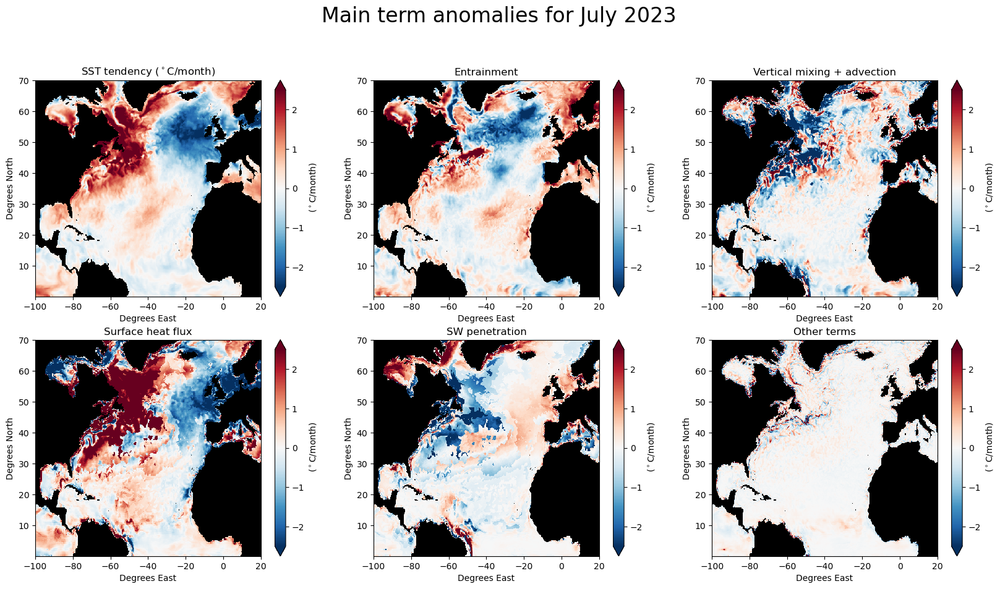

In [60]:
%%time
climatology = xr.open_dataset('/g/data/e14/mv7494/NASST_data/' + 'mon_budget_temp_om2_omip2_extension_climatology.nc')
data = xr.open_dataset('/g/data/e14/mv7494/NASST_data/' + 'full_mixed_layer_heat_budget_year_2023.nc')

# Spatial plots of all terms:
monat = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'May-August', 'October', 'November', 'December']

for f in [5,6]:
    if f <=7: maps = (data.isel(time=f)-climatology.isel(month=f))
    if f == 8: maps = (data.isel(time=slice(5,8)).mean('time')-climatology.isel(month=slice(5,8)).mean('month'))

    # Spatial plots of just the main terms:
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20,10))
    axs = axes.reshape(-1)
    
    
    # Select budget and convert units
    budget = maps*86400*30.5 # Average May-July and convert from degC s-1 to degC/month
    # budget = day_budget_temp*86400*30.5 # Convert from degC s-1 to degC/month
    
    budget['vertical_mixing'] = budget['temp_vdiffuse_diff_cbt']+budget['temp_nonlocal_KPP']
    budget['ocean_dynamics'] = budget['vertical_mixing']+budget['temp_advection']
    
    vars = ['mlt_tendency','entrainment','ocean_dynamics','temp_vdiffuse_sbc','sw_heat','other_terms']
    names = ['SST tendency ($^\circ$C/month)','Entrainment','Vertical mixing + advection','Surface heat flux','SW penetration','Other terms']
    budget['other_terms'] = budget['mlt_tendency'].copy()
    for var in vars[1:-1]:
        budget['other_terms'] -= budget[var]
    
    # Average May-Aug:
    budget_tavg = budget#.mean('time')
    for i, var in enumerate(vars):
        budget_tavg[var].plot(ax=axs[i],vmin=-2.5,vmax=2.5,cmap='RdBu_r', cbar_kwargs={'label':' ($^\circ$C/month)'},extend='both')
        axs[i].set_title(names[i])
    
    for ax in axs:
        ax.set_xlabel('Degrees East')
        ax.set_ylabel('Degrees North')
        ax.set_facecolor('k')
    plt.suptitle('Main term anomalies for '+monat[f]+' 2023', fontsize=24, y=.95)
    plt.savefig('NASST_figures/monthly_anomalous_ml_temperature_budget_Atlantic_'+monat[f]+'_2023_mainterms.png',dpi=300)

### ... and now just four panels
(a) MLT tendency
(b) Net Q_s minus Q_sw_MLD
(c) Total advection
(d) Total mixing + entrainment

- For panel (b) I remove the shortwave heat flux across the mixed layer from the net surface heat flux as suggested by Matt's email on the 24th of April 2024: "  Does the net surface heat flux have the Q_sw at the base of the mixed layer removed?   That would be best, to be consistent with Zhi’s analysis.  Although at some point it would also be good to show the readers just how big this is, maybe in Suppl. Info."

CPU times: user 13.3 s, sys: 1.1 s, total: 14.4 s
Wall time: 12.6 s


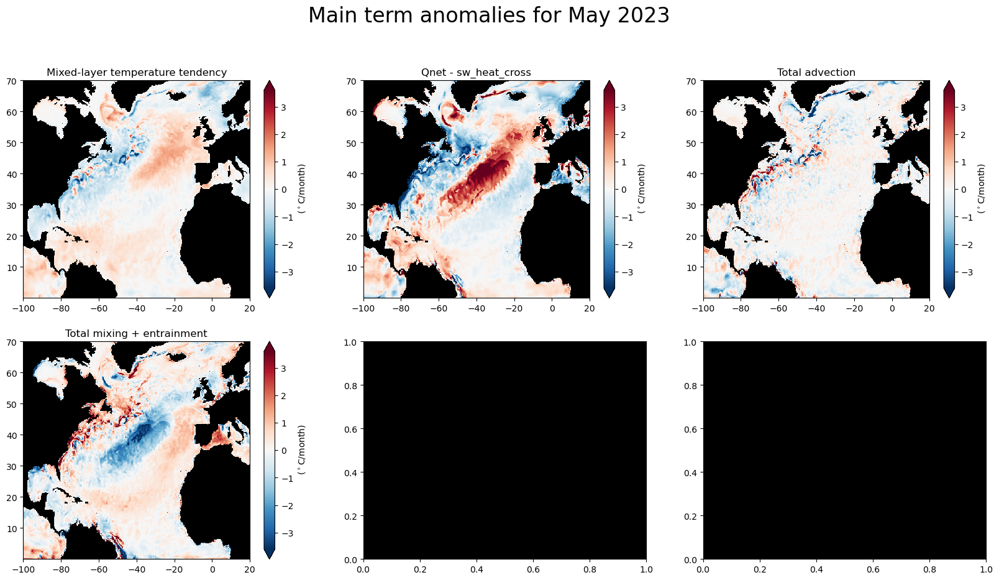

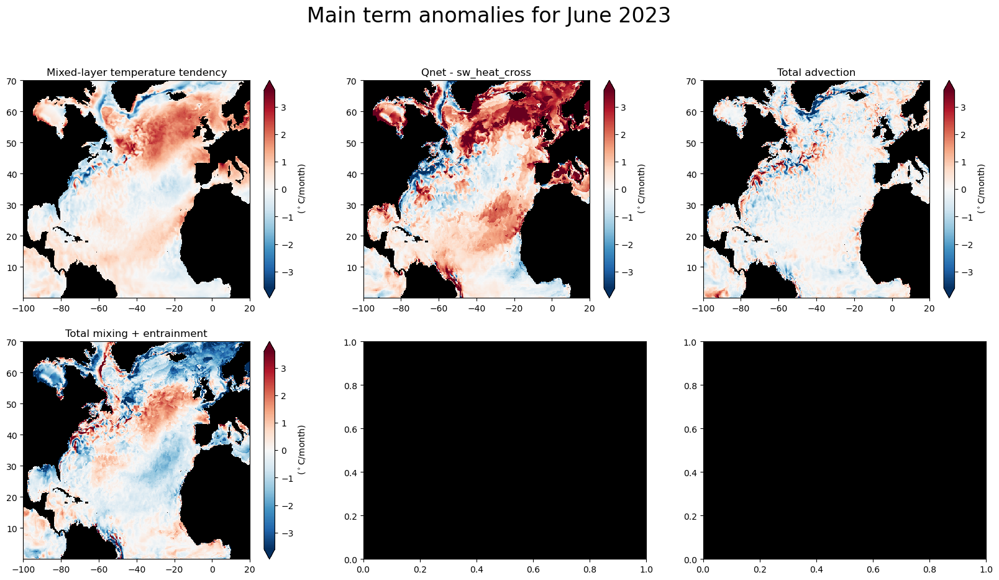

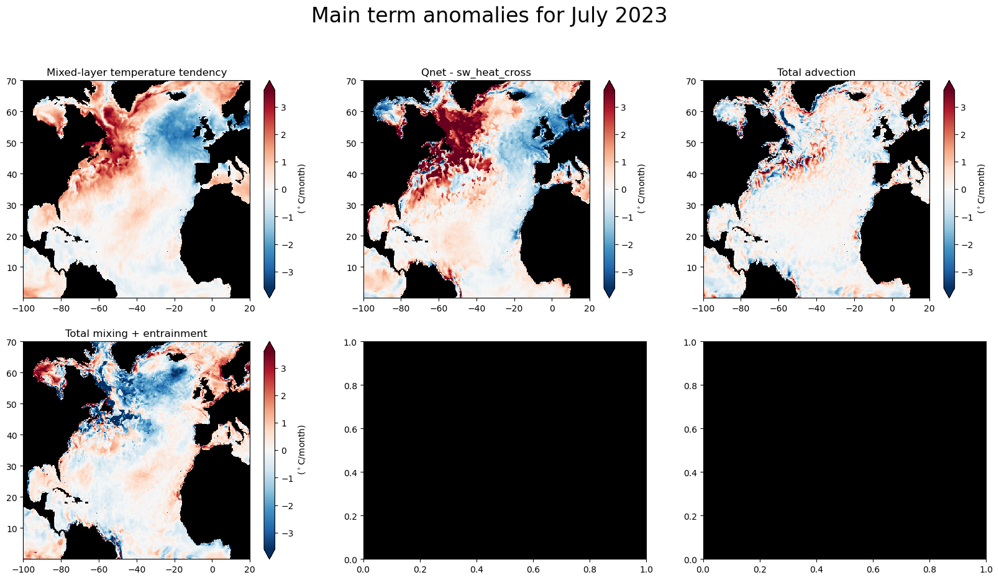

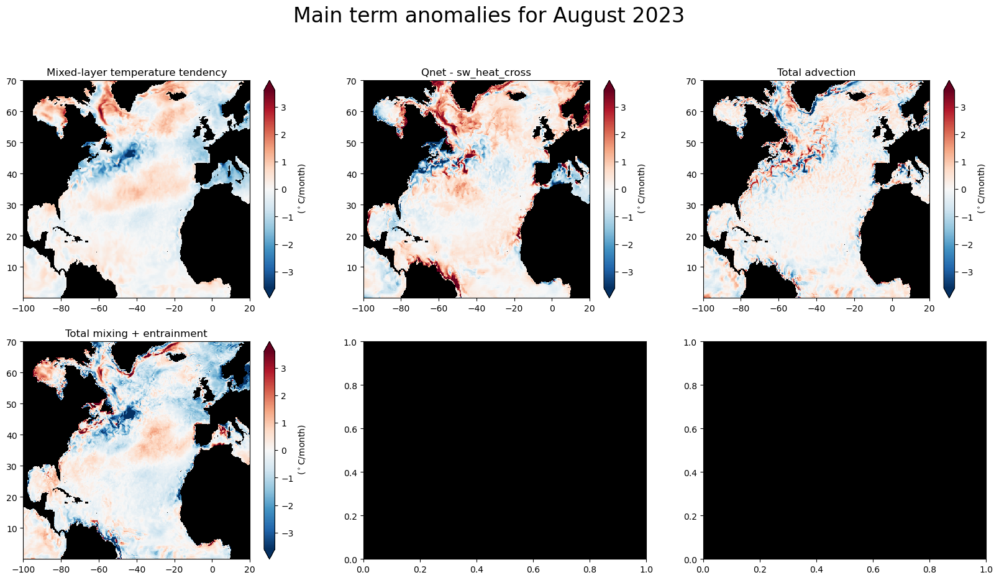

In [14]:
%%time
climatology = xr.open_dataset('/g/data/e14/mv7494/NASST_data/' + 'mon_budget_temp_om2_omip2_extension_climatology.nc')
data = xr.open_dataset('/g/data/e14/mv7494/NASST_data/' + 'full_mixed_layer_heat_budget_year_2023.nc')

# Spatial plots of all terms:
monat = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'May-August', 'October', 'November', 'December']

for f in [4,5,6,7]:
    if f <=7: maps = (data.isel(time=f)-climatology.isel(month=f))
    if f == 8: maps = (data.isel(time=slice(5,8)).mean('time')-climatology.isel(month=slice(5,8)).mean('month'))


    # Spatial plots of just the main terms:
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20,10))
    axs = axes.reshape(-1)
    
    
    # Select budget and convert units
    budget = maps*86400*30.5 # Average May-July and convert from degC s-1 to degC/month
    # budget = day_budget_temp*86400*30.5 # Convert from degC s-1 to degC/month
    
    budget['Qnet'] = budget['temp_vdiffuse_sbc']+budget['temp_eta_smooth']+budget['frazil_3d'] + budget['sw_heat'] - budget['sw_heat_cross'] # remove sw_heat as per Matt's idea (2024-04-24, 11:46 AEST)

    vars = ['mlt_tendency','Qnet','temp_advection','other_terms']
    names = ['Mixed-layer temperature tendency','Qnet - sw_heat_cross','Total advection', 'Total mixing + entrainment']
    
    budget['other_terms'] = budget['mlt_tendency'].copy()
    budget['other_terms'] = budget['entrainment'] + budget['temp_submeso'] + budget['temp_vdiffuse_diff_cbt'] + budget['temp_nonlocal_KPP'] + budget['neutral_diffusion_temp'] + budget['neutral_gm_temp'] + budget['temp_vdiffuse_k33'] + budget['temp_rivermix'] + budget['sfc_hflux_pme'] + budget['residual']

    # for var in vars[1:-1]:
    #     budget['other_terms'] -= budget[var]
    
    # Average May-Aug:
    budget_tavg = budget#.mean('time')
    for i, var in enumerate(vars):
        budget_tavg[var].plot(ax=axs[i],vmin=-3.6,vmax=3.6,cmap='RdBu_r', cbar_kwargs={'label':' ($^\circ$C/month)'},extend='both')
        axs[i].set_title(names[i])
    
    for ax in axs:
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_facecolor('k')
    plt.suptitle('Main term anomalies for '+monat[f]+' 2023', fontsize=24, y=1)
    plt.savefig('NASST_figures/monthly_anomalous_ml_temperature_budget_Atlantic_'+monat[f]+'_2023_mainterms_condensed.png',dpi=300)

    # save the main term anomalies
    budget_save = budget[['mlt_tendency', 'Qnet', 'temp_advection', 'other_terms']]
    budget_save.attrs = {
                   'Project': 'North Atlantic Ocean Heat Wave 2023',
                   'Author': 'Maurice F. Huguenin', 
                   'Data set': 'ACCESS-OM2-025 JRA55-do IAF simulation (cycle 6) anomalies',
                   'Climatology': '1981-2010 monthly climatology',
                   'Created': '2024-04-29', 
                   'Mail': 'm.huguenin-virchaux@unsw.edu.au', 
                   'Funding': 'UNSW (Program code 1476), ARC ACEAS (ARC Grant No. SR200100008), ARC CLEX (ARC Grant No. CE170100023)'}
    budget_save.to_netcdf('/g/data/e14/mv7494/NASST_data/anomalies/main_terms_of_full_mixed_layer_heat_budget_'+monat[f]+'_2023.nc')
# Wall time: 1.55 s

### Quick test if MLD_tendency = Qnet + advection + rest

Text(0.5, 1.0, 'Difference between first and second panel')

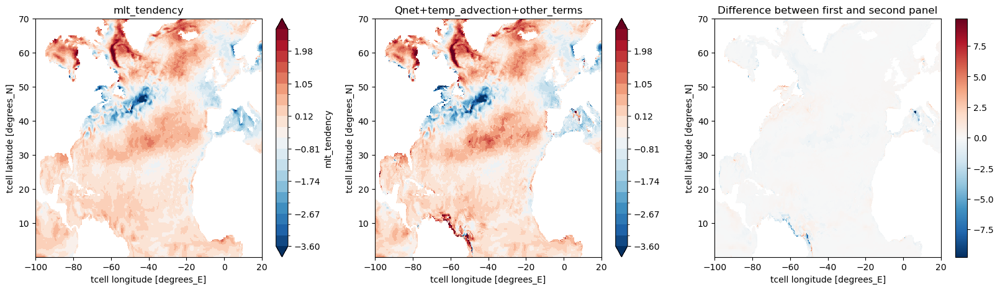

In [15]:
plt.figure(figsize=(20,5))
plt.subplot(1,3,1); (budget['mlt_tendency']).plot(levels=np.linspace(-3.6,2.6,21)); plt.title('mlt_tendency')
plt.subplot(1,3,2); (budget['Qnet'] + budget['temp_advection'] + budget['other_terms']).plot(levels=np.linspace(-3.6,2.6,21)); plt.title('Qnet+temp_advection+other_terms')
plt.subplot(1,3,3); (budget['mlt_tendency'] - (budget['Qnet'] + budget['temp_advection'] + budget['other_terms'])).plot(); plt.title('Difference between first and second panel')
# great, all the terms included now

### Testing the net_surface_heating flux and its four components if all is okay

CPU times: user 1.13 s, sys: 747 ms, total: 1.88 s
Wall time: 2.58 s


Text(0.5, 1.0, 'Difference')

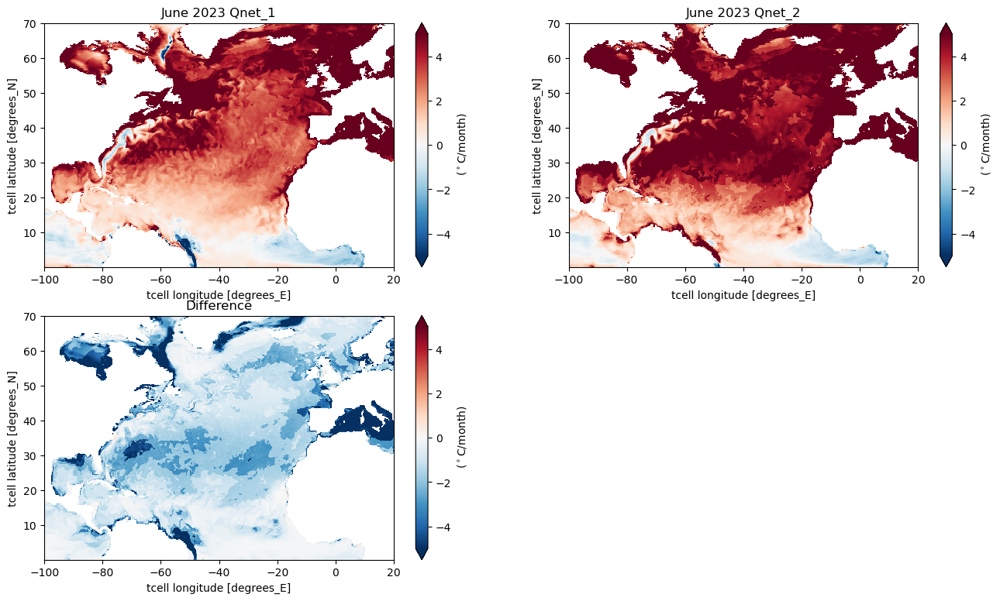

In [16]:
%%time
budget = xr.open_dataset('/g/data/e14/mv7494/NASST_data/'+'full_mixed_layer_heat_budget_year_2023.nc')*86400*30.5
net_sfc_heating = (budget['temp_vdiffuse_sbc']+budget['temp_eta_smooth']+budget['frazil_3d'] + budget['sw_heat'])
net_sfc_heating_components = (budget['swflx']+budget['lw_heat']+budget['sens_heat'] + budget['evap_heat'])

plt.figure(figsize=(16,9))
plt.subplot(2,2,1)
net_sfc_heating[5,:,:].plot(vmin=-5,vmax=5,cmap='RdBu_r', cbar_kwargs={'label':' ($^\circ$C/month)'},extend='both')
plt.title('June 2023 Qnet_1')

plt.subplot(2,2,2)
net_sfc_heating_components[5,:,:].plot(vmin=-5,vmax=5,cmap='RdBu_r', cbar_kwargs={'label':' ($^\circ$C/month)'},extend='both')
plt.title('June 2023 Qnet_2')

plt.subplot(2,2,3)
(net_sfc_heating[5,:,:]-net_sfc_heating_components[5,:,:]).plot(vmin=-5,vmax=5,cmap='RdBu_r', cbar_kwargs={'label':' ($^\circ$C/month)'},extend='both')
plt.title('Difference')
# okay the difference is because in the net_sfc_heating term there are lots more than just the four dominant terms, see this issue on github and Ryan's response Jun 5, 2020:
# https://github.com/COSIMA/access-om2/issues/139

### and now the June 2023 anomalies

CPU times: user 959 ms, sys: 613 ms, total: 1.57 s
Wall time: 1.27 s


Text(0.5, 1.0, 'Difference')

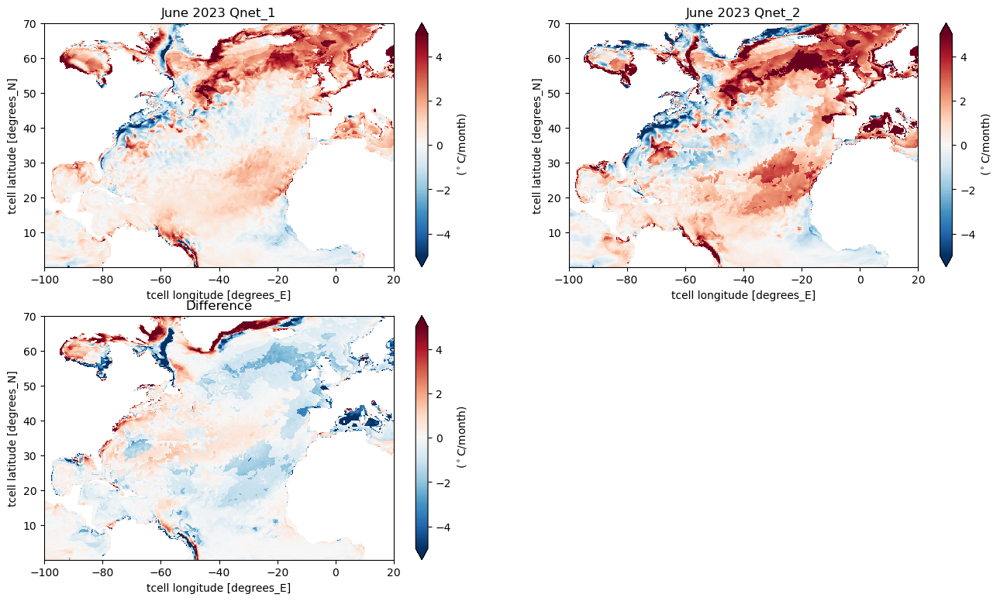

In [17]:
%%time
budget = xr.open_dataset('/g/data/e14/mv7494/NASST_data/'+'full_mixed_layer_heat_budget_year_2023.nc')*86400*30.5
clim = xr.open_dataset('/g/data/e14/mv7494/NASST_data/'+'mon_budget_temp_om2_omip2_extension_climatology.nc')*86400*30.5
net_sfc_heating_anom = (budget['temp_vdiffuse_sbc']+budget['temp_eta_smooth']+budget['frazil_3d'] + budget['sw_heat'])[5,:,:] - (
    clim['temp_vdiffuse_sbc']+clim['temp_eta_smooth']+clim['frazil_3d'] + clim['sw_heat'])[5,:,:]
net_sfc_heating_components_anom = (budget['swflx']+budget['lw_heat']+budget['sens_heat'] + budget['evap_heat'])[5,:,:] - (
    clim['swflx']+clim['lw_heat']+clim['sens_heat'] + clim['evap_heat'])[5,:,:]

plt.figure(figsize=(16,9))
plt.subplot(2,2,1)
net_sfc_heating_anom.plot(vmin=-5,vmax=5,cmap='RdBu_r', cbar_kwargs={'label':' ($^\circ$C/month)'},extend='both')
plt.title('June 2023 Qnet_1')

plt.subplot(2,2,2)
net_sfc_heating_components_anom.plot(vmin=-5,vmax=5,cmap='RdBu_r', cbar_kwargs={'label':' ($^\circ$C/month)'},extend='both')
plt.title('June 2023 Qnet_2')

plt.subplot(2,2,3)
(net_sfc_heating_anom-net_sfc_heating_components_anom).plot(vmin=-5,vmax=5,cmap='RdBu_r', cbar_kwargs={'label':' ($^\circ$C/month)'},extend='both')
plt.title('Difference')
# okay the difference is because in the net_sfc_heating term there are lots more than just the four dominant terms, see this issue on github and Ryan's response Jun 5, 2020:
# https://github.com/COSIMA/access-om2/issues/139

Text(0.5, 1.0, 'June 2023 evap_heat')

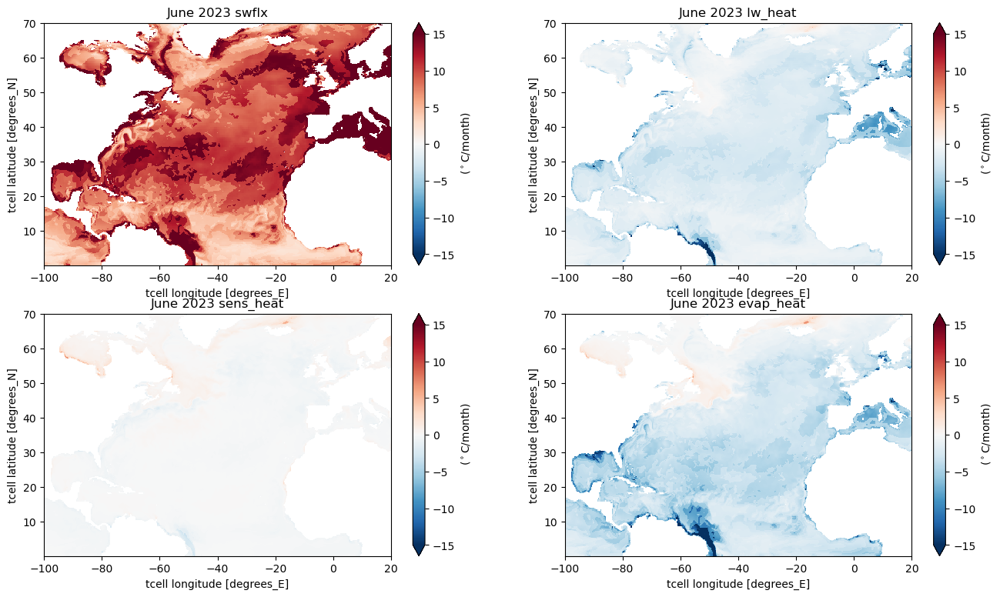

In [18]:
plt.figure(figsize=(16,9))
plt.subplot(2,2,1)
(budget['swflx'][5,:,:]).plot(vmin=-15,vmax=15,cmap='RdBu_r', cbar_kwargs={'label':' ($^\circ$C/month)'},extend='both')
plt.title('June 2023 swflx')

plt.subplot(2,2,2)
(budget['lw_heat'][5,:,:]).plot(vmin=-15,vmax=15,cmap='RdBu_r', cbar_kwargs={'label':' ($^\circ$C/month)'},extend='both')
plt.title('June 2023 lw_heat')

plt.subplot(2,2,3)
(budget['sens_heat'][5,:,:]).plot(vmin=-15,vmax=15,cmap='RdBu_r', cbar_kwargs={'label':' ($^\circ$C/month)'},extend='both')
plt.title('June 2023 sens_heat')

plt.subplot(2,2,4)
(budget['evap_heat'][5,:,:]).plot(vmin=-15,vmax=15,cmap='RdBu_r', cbar_kwargs={'label':' ($^\circ$C/month)'},extend='both')
plt.title('June 2023 evap_heat')

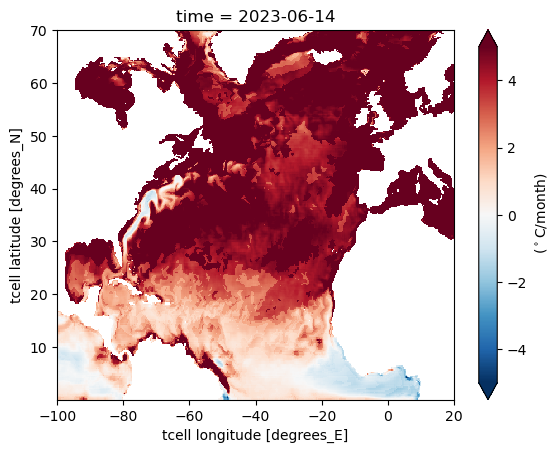

In [19]:
((budget['swflx'][5,:,:]) + (budget['lw_heat'][5,:,:]) + (budget['sens_heat'][5,:,:]) + (budget['evap_heat'][5,:,:])).plot(vmin=-5,vmax=5,cmap='RdBu_r', cbar_kwargs={'label':' ($^\circ$C/month)'},extend='both')